# **Case Study - Back Order Prediction**

## **Back Order Dataset**

https://www.kaggle.com/ztrimus/backorder-dataset

The data used for this project comes from the "Backorder Dataset" data set uploaded to Kaggle.

## **Background**

The dataset is historical data, which contains information of an anonymous company’s products for the 8 weeks prior to the week that is going to be predicted.

## **Dataset characteristics**


1.   sku - Stock keeping unit, a unique product identifier
2.   national_inv - Current inventory level for the product
3.   lead_time - Transit time for the product
4.   intransitqty - Amount of the product in transit from source
5.   forecast6month - Forecast sales for the next 6 months
6.   forecast9month - Forecast sales for the next 9 months
7.   sales1month - Sales quantity for the prior 1 month
8.   sales3month - Sales quantity for the prior 3 month
9.   sales6month - Sales quantity for the prior 6 month
10.  sales9month - Sales quantity for the prior 9 month
11.  min_bank - Minimum recommend amount to stock
12.  potential_issue - Source issue for part identified; 1 indicates that some issues are identified, and 0 indicates no issue
13.  piecespastdue - Amount overdue from source
14.  perf6month_avg - Source performance for the prior 6 months
15.  perf9month_avg - Source performance for the prior 9 months
16.  perf12month_avg - Source performance for the prior 12 months
17.  localboqty - Amount of stock orders overdue
18.  deck_risk - Part risk flag; 1 indicates risk identified, and 0 indicates no risk
19.  oe_constraint - Part risk flag; 1 indicates risk identified, and 0 indicates no risk
20.  ppap_risk - Part risk flag; 1 indicates risk identified, and 0 indicates no risk
21.  stopautobuy - Part risk flag; 1 indicates risk identified, and 0 indicates no risk
22.  rev_stop - Part risk flag; 1 indicates risk identified, and 0 indicates no risk
23.  wentonback_order - Product actually went on backorder. This is the target value.







# **Notebook Contains:-**

1.Import all the neceassary modules and load the data

2.Exploratory Data Analysis

3.Preprocessing

3.Feature Selection

4.Feature Scaling

5.Test - Train Split

6.Modelling & Evaluation

### **Import all the neceassary modules and load the data**

In [1]:
!pip install -U --force-reinstall matplotlib

ERROR: phik 0.12.0 has requirement scipy>=1.5.2, but you'll have scipy 1.5.0 which is incompatible.
ERROR: Could not install packages due to an EnvironmentError: [WinError 5] Access is denied: 'C:\\Users\\Priyam\\anaconda3\\Lib\\site-packages\\~il\\_imaging.cp38-win_amd64.pyd'
Consider using the `--user` option or check the permissions.




  Using cached matplotlib-3.5.1-cp38-cp38-win_amd64.whl (7.2 MB)
  Using cached Pillow-8.4.0-cp38-cp38-win_amd64.whl (3.2 MB)
  Using cached fonttools-4.28.5-py3-none-any.whl (890 kB)
  Using cached numpy-1.21.5-cp38-cp38-win_amd64.whl (14.0 MB)
  Using cached python_dateutil-2.8.2-py2.py3-none-any.whl (247 kB)
  Using cached cycler-0.11.0-py3-none-any.whl (6.4 kB)
  Using cached pyparsing-3.0.6-py3-none-any.whl (97 kB)
  Using cached kiwisolver-1.3.2-cp38-cp38-win_amd64.whl (52 kB)
  Using cached packaging-21.3-py3-none-any.whl (40 kB)
  Using cached six-1.16.0-py2.py3-none-any.whl (11 kB)
  Attempting uninstall: pillow
    Found existing installation: Pillow 8.4.0
    Uninstalling Pillow-8.4.0:
      Successfully uninstalled Pillow-8.4.0


In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
# !pip install pandas-profiling==3.1.0

# importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn import metrics
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score,confusion_matrix,classification_report

from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import MinMaxScaler       # Preprocessing method
from sklearn.neighbors import KNeighborsClassifier   # K-Nearest Neighbours Classifier model
from sklearn.svm import SVC                          # Support Vector Classifier model
from sklearn.ensemble import RandomForestClassifier  # Random Forest Classifier model
import pandas_profiling as pp
%matplotlib inline


In [ ]:
  # Reading training csv file
test_dataset = pd.read_csv("Kaggle_Test_Dataset_v2.csv")
test_dataset

In [5]:
# Reading test csv file
training_dataset = pd.read_csv("Kaggle_Training_Dataset_v2.csv")
training_dataset

C:\Users\Priyam\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,sku,national_inv,lead_time,in_transit_qty,forecast_3_month,forecast_6_month,forecast_9_month,sales_1_month,sales_3_month,sales_6_month,...,pieces_past_due,perf_6_month_avg,perf_12_month_avg,local_bo_qty,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop,went_on_backorder
0,1026827,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,-99.00,-99.00,0.0,No,No,No,Yes,No,No
1,1043384,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.99,0.99,0.0,No,No,No,Yes,No,No
2,1043696,2.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,-99.00,-99.00,0.0,Yes,No,No,Yes,No,No
3,1043852,7.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.10,0.13,0.0,No,No,No,Yes,No,No
4,1044048,8.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,-99.00,-99.00,0.0,Yes,No,No,Yes,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1687856,1373987,-1.0,NaN,0.0,5.0,7.0,9.0,1.0,3.0,3.0,...,0.0,-99.00,-99.00,1.0,No,No,No,Yes,No,No
1687857,1524346,-1.0,9.0,0.0,7.0,9.0,11.0,0.0,8.0,11.0,...,0.0,0.86,0.84,1.0,Yes,No,No,No,No,Yes
1687858,1439563,62.0,9.0,16.0,39.0,87.0,126.0,35.0,63.0,153.0,...,0.0,0.86,0.84,6.0,No,No,No,Yes,No,No
1687859,1502009,19.0,4.0,0.0,0.0,0.0,0.0,2.0,7.0,12.0,...,0.0,0.73,0.78,1.0,No,No,No,Yes,No,No


In [6]:
training_dataset.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1687861 entries, 0 to 1687860
Data columns (total 23 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   sku                1687861 non-null  object 
 1   national_inv       1687860 non-null  float64
 2   lead_time          1586967 non-null  float64
 3   in_transit_qty     1687860 non-null  float64
 4   forecast_3_month   1687860 non-null  float64
 5   forecast_6_month   1687860 non-null  float64
 6   forecast_9_month   1687860 non-null  float64
 7   sales_1_month      1687860 non-null  float64
 8   sales_3_month      1687860 non-null  float64
 9   sales_6_month      1687860 non-null  float64
 10  sales_9_month      1687860 non-null  float64
 11  min_bank           1687860 non-null  float64
 12  potential_issue    1687860 non-null  object 
 13  pieces_past_due    1687860 non-null  float64
 14  perf_6_month_avg   1687860 non-null  float64
 15  perf_12_month_avg  1687860 non-n

### **Exploratory Data Analysis**

In [5]:
# !pip3 install joblib

In [6]:
# !pip3 install dill

In [7]:
 # For indepth understanding of profile report please visit https://pypi.org/project/pandas-profiling/
 
 training_profile = pp.ProfileReport(training_dataset,title="Pandas Profiling Report",explorative=True)
#  test_profile = pp.profile_report(test_dataset)
 training_profile


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
 #generating html report
training_profile.to_file("EDA_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#count of backorder with each quinique feature
# training_dataset.groupby('went_on_backorder').count() 

In [ ]:
# precentage count of each yes and no
# training_dataset.went_on_backorder.value_counts(normalize=True)

In [ ]:
# Summarise the numerical data in train_df
# training_dataset.describe()

In [ ]:
# Summarise the non-numerical data in train_df
# training_dataset.describe(include=['O'])


### **My Observations:**
1.The data are a mix of string and floating point values.

2.The sku has a unique value for each row, so it is the index column and should be dropped.

3.The features with string values, apart from sku, are categorical features that only contain 'yes' and 'no'. They can be changed to represent the same information in numerical values.

4.The numerical features have different scales, which may be a problem for some machine learning algorithms. The features should be rescaled to have similar scale

5.There are missing values in lead_time, perf_6_month_avg and perf_12_month_avg. These missing values need to be replaced or the samples with missing values need to be removed.

6.lead_time has (1687860 - 1586967 = 100,893) (5.98%) missing values

7.perf_6_month_avg has (1687860 - 1558382 = 129,478) (7.67%) missing values

8.perf_12_month_avg has (1687860 - 1565810 = 122,050) (7.23%) missing values

9.The last row is not a valid sample in both the training and testing datasets, and thus should be dropped.

10.There are 1,676,567 samples when the product did not go on backorder. There are 11,293 (0.67%) samples when the product did go on backorder.


### **Preprocessing**

In [7]:

# Drop the sku column
training_dataset = training_dataset.drop('sku', axis=1)
test_dataset = test_dataset.drop('sku', axis=1)

In [8]:

# Drop the last row
training_dataset = training_dataset[:-1]
test_dataset = test_dataset[:-1]

In [9]:

# Change categorical features from string to numerical
Cols_for_str_to_bool = ['potential_issue', 'deck_risk', 'oe_constraint', 'ppap_risk',
                        'stop_auto_buy', 'rev_stop', 'went_on_backorder']

for col_name in Cols_for_str_to_bool:
    training_dataset[col_name] = training_dataset[col_name].map({'No':0, 'Yes':1})
    test_dataset[col_name] = test_dataset[col_name].map({'No':0, 'Yes':1})

In [10]:

#training_dataset.isnull().sum()
#test_dataset.isnull().sum()

train_df = training_dataset.dropna()
test_df = test_dataset.dropna()



In [11]:
train_df

,national_inv,lead_time,in_transit_qty,forecast_3_month,forecast_6_month,forecast_9_month,sales_1_month,sales_3_month,sales_6_month,sales_9_month,...,pieces_past_due,perf_6_month_avg,perf_12_month_avg,local_bo_qty,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop,went_on_backorder
1,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.99,0.99,0.0,0,0,0,1,0,0
3,7.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.10,0.13,0.0,0,0,0,1,0,0
5,13.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.82,0.87,0.0,0,0,0,1,0,0
7,6.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00,0.00,0.0,1,0,1,1,0,0
9,4.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.82,0.87,0.0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1687854,124.0,8.0,140.0,410.0,780.0,1240.0,128.0,464.0,849.0,1074.0,...,0.0,0.85,0.90,1.0,0,0,0,1,0,0
1687855,0.0,2.0,0.0,10.0,10.0,10.0,0.0,5.0,7.0,7.0,...,0.0,0.69,0.69,5.0,1,0,0,1,0,0
1687857,-1.0,9.0,0.0,7.0,9.0,11.0,0.0,8.0,11.0,12.0,...,0.0,0.86,0.84,1.0,1,0,0,0,0,1
1687858,62.0,9.0,16.0,39.0,87.0,126.0,35.0,63.0,153.0,205.0,...,0.0,0.86,0.84,6.0,0,0,0,1,0,0


### **Feature Selection**

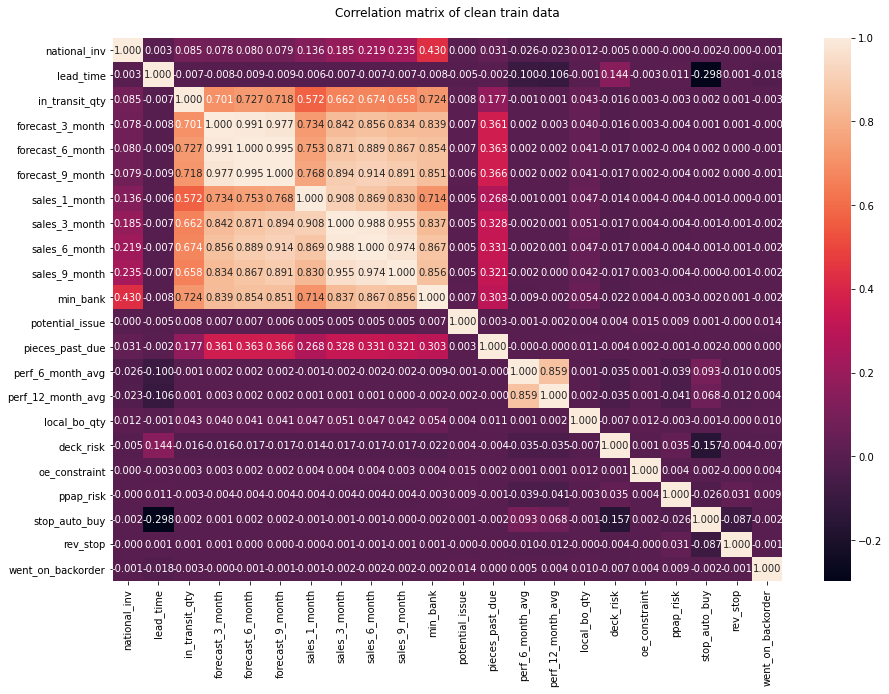

In [14]:
# correlation of clean traning data

# Set figure size 
fig = plt.figure(figsize=(15,10)) 

hm = sns.heatmap(train_df.corr(), annot = True,fmt=".3f")

hm.set( title = "Correlation matrix of clean train data\n")

plt.show()

### **Notes on correlation matrix**
The correlation matrix shows that the quantity in transit, the forecast sales over 3/6/9 months, the actual sales over the previous 1/3/6/9 months, and minimum recommended stock level are highly correlated. This is not surprising because if an item had high real sales over the last 1/3/6/9 months, then it is axpected for the forecast sales over the next 3/6/9 months to also be high. If forecast sales are high, then it would be useful to have more of the stock in hand and to have more shipped in.

Besides that, the average performance over the last 6 months strongly correlates with that over the last 12 months.

Overall, the correlation matrix suggests that the number of features used for predicting whether an item goes on back order can be lower than the number of features in the dataset. In other words, the dimensionality of the problem may be reduced.

So according to the analysis what i strongly belive is we should not consider all these feature for building model which will increase complexity and need more features information by an organistation for to predict backorder which can be done by any one or two of these feature.  

In [15]:

# feature got Selected on above observation
features = ['national_inv', 'lead_time', 'sales_1_month', 'pieces_past_due', 'perf_6_month_avg',
            'local_bo_qty', 'deck_risk', 'oe_constraint', 'ppap_risk', 'stop_auto_buy', 'rev_stop']

In [16]:

#introducing same feature for training and test data
new_train_df = train_df[features]
new_test_df = test_df[features]

# Set labels
train_label = train_df['went_on_backorder']
test_label = test_df['went_on_backorder']

In [17]:
new_test_df


,national_inv,lead_time,sales_1_month,pieces_past_due,perf_6_month_avg,local_bo_qty,deck_risk,oe_constraint,ppap_risk,stop_auto_buy,rev_stop
2,17.0,8.0,0.0,0.0,0.92,0.0,0,0,0,1,0
3,9.0,2.0,0.0,0.0,0.78,0.0,0,0,1,1,0
4,2.0,8.0,0.0,0.0,0.54,0.0,0,0,0,1,0
5,15.0,2.0,0.0,0.0,0.37,0.0,0,0,0,1,0
13,208.0,16.0,0.0,0.0,0.66,0.0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
242070,12.0,12.0,0.0,0.0,0.48,0.0,1,0,0,1,0
242071,13.0,12.0,0.0,0.0,0.48,0.0,1,0,0,1,0
242072,13.0,12.0,0.0,0.0,0.48,0.0,1,0,0,1,0
242073,10.0,12.0,0.0,0.0,0.48,0.0,1,0,0,1,0


### **Feature Scaling**

In [18]:
# RF_result_DF = pd.DataFrame({"Method":["RandomForest"],"Accuracy":RF_accuracy})
# result_DF=pd.concat([result_DF,RF_result_DF])
# # result_DF = result_DF[["Method","Accuracy"]]
# result_DF

In [19]:
# Change scale of data

# Use MinMaxScaler to convert features to range 0-1
# The label is already in the range 0-1, so it won't be affected by this.mms_train = MinMaxScaler().fit(new_train_df)
# mms_test = MinMaxScaler().fit(new_test_df)
# mms_train = MinMaxScaler().fit(new_train_df)


# Scaled_train_df = pd.DataFrame(mms_train.transform(new_train_df), columns=features)
# Scaled_test_df = pd.DataFrame(mms_test.transform(new_test_df),columns=features)

In [20]:
# Scaled_train_df

In [21]:
# Scaled_test_df

In [22]:
# Target value is went_on_backorder
# See the distribution of data
# this target data is completly bais to 0 value which indicates how many back order happen 

train_label.value_counts()


0    1575998
1      10969
Name: went_on_backorder, dtype: int64

In [23]:
test_label.value_counts()

0    224747
1      2604
Name: went_on_backorder, dtype: int64

In [24]:
# used for under sampling 
# Here in this dataset the target variable went_on_backorder is baised which is 0 is almost 90% of data and rest is 1
# Here this undersampling will reduce the 90% to 10% data as equal to number of data of 1 in went_on_backorder

from imblearn.under_sampling import RandomUnderSampler  

under_sampler = RandomUnderSampler()
X_train, y_train = under_sampler.fit_resample(new_train_df,train_label)
X_test,y_test = under_sampler.fit_resample(new_test_df,test_label)

In [ ]:
from imblearn.over_sampling import ADASYN

ada = ADAS bbb np,YN(sampling_strategy='all', random_state=420, n_neighbors=5)
X_new_train, y_new_train =ada.fit_resample(new_train_df,train_label)
X_new_test, y_new_test =ada.fit_resample(new_test_df,test_label)


In [ ]:
y_new_train.shape

In [ ]:
X_train

In [ ]:
X_test

In [25]:
# used for under sampling 
# Here in this dataset the target variable went_on_backorder is baised which is 0 is almost 90% of data and rest is 1
# Here this undersampling will reduce the 90% to 10% data as equal to number of data of 1 in went_on_backorder


# from imblearn.under_sampling import NearMiss

# nm=NearMiss()
# X_train,y_train = nm.fit_sample(Scaled_train_df,train_label)
# X_test,y_test = nm.fit_sample(Scaled_test_df,test_label)

In [26]:

# from imblearn.combine import SMOTETomek

# smk = SMOTETomek(random_state=42)
# # a_train,b_train = smk.fit_sample(Scaled_train_df,train_label)
# a_test,b_test = smk.fit_sample(Scaled_test_df,test_label)

# **Model**

### **Logistic Regression**

In [64]:
from sklearn.linear_model import LogisticRegression

LR = LogisticRegression(random_state = 0)
LR.fit(X_new_train,y_new_train)

C:\Users\Priyam\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [71]:
LR.score(X_new_train,y_new_train)

0.656758878829752

In [72]:
LR.score(X_new_test,y_new_test)

0.660624462369774

In [77]:
LR_pred = LR.predict(X_new_test)
LR_pred

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [80]:
print("Accuracy of Logistic regresiion",accuracy_score(y_new_test,LR_pred))
print("f1 score of this logistic regression",f1_score(y_new_test,LR_pred))
print("recall score of logistic regression",recall_score(y_new_test,LR_pred))
print("precision score of logistic regression",precision_score(y_new_test,LR_pred))

Accuracy of Logistic regresiion 0.660624462369774
f1 score of this logistic regression 0.6969103844749003
recall score of logistic regression 0.7796565753473332
precision score of logistic regression 0.6300429276976971


Text(0.5, 1.1, 'Confusion matrix Logistic Regression\n')

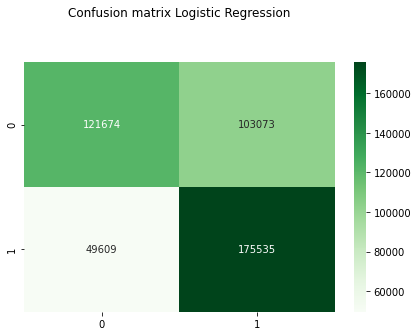

In [81]:
# plotting confusion matrix LogReg

cnf_matrix_log = confusion_matrix(y_new_test,LR_pred)

sns.heatmap(pd.DataFrame(cnf_matrix_log), annot=True,cmap="Greens" , fmt='g')
# ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix Logistic Regression\n', y=1.1)

In [83]:
print("Report : ",classification_report(y_new_test,LR_pred))

Report :                precision    recall  f1-score   support

           0       0.71      0.54      0.61    224747
           1       0.63      0.78      0.70    225144

    accuracy                           0.66    449891
   macro avg       0.67      0.66      0.66    449891
weighted avg       0.67      0.66      0.66    449891



### **Decision Tree**

In [84]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
# DT_classifier=DecisionTreeClassifier(criterion='gini',max_depth=11,max_features=6,max_leaf_nodes=6)
DT_classifier=DecisionTreeClassifier(criterion='gini',max_depth=8)
DT_classifier.fit(X_new_train,y_new_train)
# 'criterion': 'gini', 'max_depth': 11, 'max_features': 6, 'min_samples_leaf': 6

DecisionTreeClassifier(max_depth=8)

In [87]:
DT_pred = DT_classifier.predict(X_new_test)
DT_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [85]:
DT_classifier.score(X_new_train,y_new_train)

0.8586163034184915

In [86]:
DT_classifier.score(X_new_test,y_new_test)

0.8431597875929947

In [88]:
cv_train = cross_val_score(DT_classifier, X_new_train,y_new_train, cv=10)
cv_train

array([0.84822894, 0.84553767, 0.84933607, 0.84932337, 0.85868889,
       0.83917713, 0.86899064, 0.85992028, 0.83821868, 0.8821011 ])

In [91]:
cv_test = cross_val_score(DT_classifier, X_new_test,y_new_test, cv=10)
cv_test

array([0.84641031, 0.85183045, 0.87094623, 0.86921247, 0.85812087,
       0.86205517, 0.85734291, 0.88139323, 0.87436929, 0.8673009 ])

In [92]:

print("Accuracy of Descision tree",accuracy_score(y_new_test,DT_pred))
print("f1 score of this Descision tree",f1_score(y_new_test,DT_pred))
print("recall score of Descision tree",recall_score(y_new_test,DT_pred))
print("precision score of Descision tree",precision_score(y_new_test,DT_pred))

Accuracy of Descision tree 0.8431597875929947
f1 score of this Descision tree 0.8395425572315117
recall score of Descision tree 0.8198930462281917
precision score of Descision tree 0.8601570326879616


Text(0.5, 1.1, 'Confusion matrix Decision Tree\n')

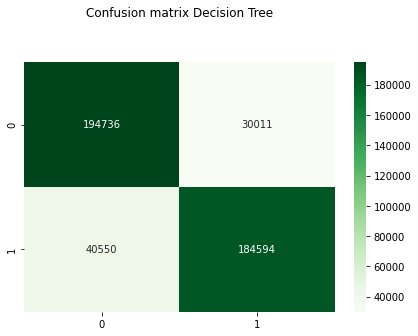

In [93]:

# plotting confusion matrix LogReg

cnf_matrix_log = confusion_matrix(y_new_test,DT_pred)

sns.heatmap(pd.DataFrame(cnf_matrix_log), annot=True,cmap="Greens" , fmt='g')
# ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix Decision Tree\n', y=1.1)

In [95]:
print("Report : ",classification_report(y_new_test,DT_pred))

Report :                precision    recall  f1-score   support

           0       0.83      0.87      0.85    224747
           1       0.86      0.82      0.84    225144

    accuracy                           0.84    449891
   macro avg       0.84      0.84      0.84    449891
weighted avg       0.84      0.84      0.84    449891



### **Decision Tree Hyperperameter tunning**

In [96]:
# Import necessary modules
from scipy.stats import randint
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV

# Setup the parameters and distributions to sample from: param_dist
param_dist = {"max_depth": [4,5,6,7,8,9,10,11,12,13,14,15],
              "max_features": randint(1, 9),
              "min_samples_leaf": randint(1, 9),
              "criterion": ["gini", "entropy"]}

# Instantiate a Decision Tree classifier: tree
tree = DecisionTreeClassifier()

# Instantiate the RandomizedSearchCV object: tree_cv
tree_cv = RandomizedSearchCV(tree, param_dist, cv=5)

# Fit it to the data
tree_cv.fit(X_new_train,y_new_train)

# Print the tuned parameters and score
print("Tuned Decision Tree Parameters: {}".format(tree_cv.best_params_))
print("Best score is {}".format(tree_cv.best_score_))

Tuned Decision Tree Parameters: {'criterion': 'gini', 'max_depth': 14, 'max_features': 8, 'min_samples_leaf': 6}
Best score is 0.8904761878342271


In [119]:
tree = DecisionTreeClassifier(criterion='gini',max_depth =10,max_features=6, min_samples_leaf=10 )
tree.fit(X_new_train,y_new_train)


DecisionTreeClassifier(max_depth=10, max_features=6, min_samples_leaf=10)

In [120]:
tree.score(X_new_train,y_new_train)

0.8589587428695474

In [121]:
tree.score(X_new_test,y_new_test)

0.8419328237284143

In [122]:
tree_pred = tree.predict(X_new_test)
tree_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [123]:
# cv_trai = cross_val_score(tree, X_new_train,y_new_train, cv=10)
# cv_trai

In [124]:
# cv_tes = cross_val_score(tree, X_new_test,y_new_test, cv=10)
# cv_tes

Text(0.5, 1.1, 'Confusion matrix Decision Tree\n')

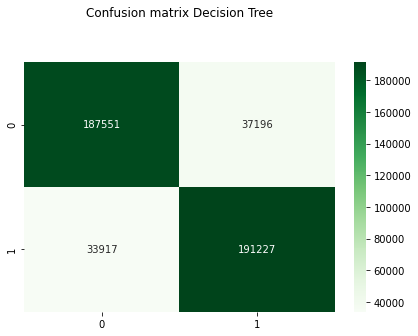

In [125]:

# plotting confusion matrix LogReg

cnf_matrix_log = confusion_matrix(y_new_test,tree_pred)

sns.heatmap(pd.DataFrame(cnf_matrix_log), annot=True,cmap="Greens" , fmt='g')
# ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix Decision Tree\n', y=1.1)

In [126]:
print("Report : ",classification_report(y_new_test,tree_pred))

Report :                precision    recall  f1-score   support

           0       0.85      0.83      0.84    224747
           1       0.84      0.85      0.84    225144

    accuracy                           0.84    449891
   macro avg       0.84      0.84      0.84    449891
weighted avg       0.84      0.84      0.84    449891



### **Pickle File**

In [85]:
import pickle
# open a file, where you ant to store the data
file = open('Tuned_DT_Back_order.pkl', 'wb')

# dump information to that file
pickle.dump(tree, file)

### **Random Forest**

In [145]:
from sklearn.ensemble import RandomForestClassifier
RF_clf = RandomForestClassifier(n_estimators=100, max_depth=15)
RF_clf.fit(X_new_train,y_new_train)

RandomForestClassifier(max_depth=15)

In [146]:
RF_clf.score(X_new_train,y_new_train)

0.9066863603732495

In [147]:
RF_clf.score(X_new_test,y_new_test)

0.8671055877979332

In [148]:
RF_pred = RF_clf.predict(X_new_test)
RF_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [149]:
# # cross validation on train data
# cv_train = cross_val_score(RF_clf, X_train,y_train, cv=10)
# cv_train

In [150]:
# # cross validation on test data
# cv_test = cross_val_score(RF_clf, X_test,y_test, cv=10)
# cv_test

In [151]:
print("Accuracy of Descision tree",accuracy_score(y_new_test,RF_pred))
print("f1 score of this Descision tree",f1_score(y_new_test,RF_pred))
print("recall score of Descision tree",recall_score(y_new_test,RF_pred))
print("precision score of Descision tree",precision_score(y_new_test,RF_pred))

Accuracy of Descision tree 0.8671055877979332
f1 score of this Descision tree 0.8634316153023838
recall score of Descision tree 0.8394627438439399
precision score of Descision tree 0.8888094655856738


In [152]:
print("Report : ",classification_report(y_new_test,RF_pred))

Report :                precision    recall  f1-score   support

           0       0.85      0.89      0.87    224747
           1       0.89      0.84      0.86    225144

    accuracy                           0.87    449891
   macro avg       0.87      0.87      0.87    449891
weighted avg       0.87      0.87      0.87    449891



Text(0.5, 1.1, 'Confusion matrix Random Forest\n')

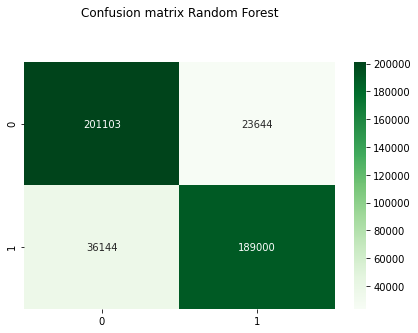

In [153]:
# plotting confusion matrix LogReg

cnf_matrix_log = confusion_matrix(y_new_test,RF_pred)

sns.heatmap(pd.DataFrame(cnf_matrix_log), annot=True,cmap="Greens" , fmt='g')
# ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix Random Forest\n', y=1.1)

### **Pickle File**

In [86]:
import pickle
# open a file, where you ant to store the data
file = open('RF_Back_order.pkl', 'wb')

# dump information to that file
pickle.dump(RF_clf, file)

### **Random Forest Hyperperameter tuning**

In [ ]:
n_estimators = [100, 300, 500, 800, 1200]
max_depth = [5, 8, 15, 25, 30]
min_samples_split = [2, 5, 10, 15, 100]
min_samples_leaf = [1, 2, 5, 10] 

hyperF = dict(n_estimators = n_estimators, max_depth = max_depth,  
              min_samples_split = min_samples_split, 
             min_samples_leaf = min_samples_leaf)

gridF = RandomizedSearchCV(RF_clf, hyperF, cv = 3, verbose = 1, 
                      n_jobs = -1)
bestF = gridF.fit(X_new_train,y_new_train)


Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


In [61]:
bestF.best_estimator_

RandomForestClassifier(max_depth=25, min_samples_split=5, n_estimators=500)

In [62]:
RF = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=25, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0,
                       min_samples_leaf=1, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
RF.fit(X_train,y_train)

RandomForestClassifier(max_depth=25, min_samples_split=5)

In [63]:
RF.score(X_train,y_train)

0.9390099370954508

In [64]:
RF.score(X_test,y_test)

0.8191244239631337

In [65]:
RF_pre = RF.predict(X_test)
RF_pre

array([1, 0, 0, ..., 1, 1, 0], dtype=int64)

In [66]:
cv_tr = cross_val_score(RF, X_train,y_train, cv=10)
cv_tr

array([0.85004558, 0.84958979, 0.88331814, 0.8928897 , 0.88742024,
       0.87830447, 0.86417502, 0.87556974, 0.85955312, 0.8878249 ])

In [67]:
cv_te = cross_val_score(RF, X_train,y_train, cv=10)
cv_te

array([0.84594348, 0.84958979, 0.88696445, 0.89653601, 0.8887876 ,
       0.88422972, 0.86554239, 0.87739289, 0.86046512, 0.88919289])

Text(0.5, 1.1, 'Confusion matrix Random Forest\n')

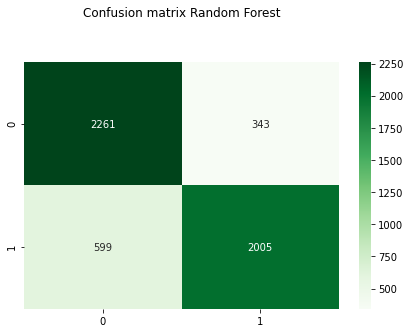

In [68]:
#  plotting confusion matrix 

cnf_matrix_log = confusion_matrix(y_test,RF_pre)

sns.heatmap(pd.DataFrame(cnf_matrix_log), annot=True,cmap="Greens" , fmt='g')
# ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix Random Forest\n', y=1.1)

In [69]:
print("Report : ",classification_report(y_test,RF_pre))

Report :                precision    recall  f1-score   support

           0       0.79      0.87      0.83      2604
           1       0.85      0.77      0.81      2604

    accuracy                           0.82      5208
   macro avg       0.82      0.82      0.82      5208
weighted avg       0.82      0.82      0.82      5208



### **K nearest neighbour**

In [70]:
from sklearn.neighbors import KNeighborsClassifier 
Knn = KNeighborsClassifier(n_neighbors=9)
Knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=9)

In [71]:
Knn.score(X_train,y_train)

0.8755583918315252

In [72]:
Knn.score(X_test,y_test)

0.821236559139785

In [73]:
Knn_pred = Knn.predict(X_test)
Knn_pred

array([1, 0, 0, ..., 1, 1, 0], dtype=int64)

In [74]:
print("Accuracy of Descision tree",accuracy_score(y_test,Knn_pred))
print("f1 score of this Descision tree",f1_score(y_test,Knn_pred))
print("recall score of Descision tree",recall_score(y_test,Knn_pred))
print("precision score of Descision tree",precision_score(y_test,Knn_pred))

Accuracy of Descision tree 0.821236559139785
f1 score of this Descision tree 0.8160442600276625
recall score of Descision tree 0.793010752688172
precision score of Descision tree 0.8404558404558404


In [75]:
print("Report : ",classification_report(y_test,Knn_pred))

Report :                precision    recall  f1-score   support

           0       0.80      0.85      0.83      2604
           1       0.84      0.79      0.82      2604

    accuracy                           0.82      5208
   macro avg       0.82      0.82      0.82      5208
weighted avg       0.82      0.82      0.82      5208



Text(0.5, 1.1, 'Confusion matrix KNN\n')

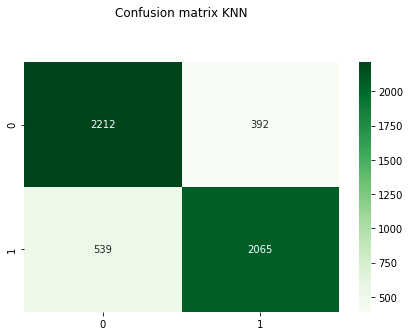

In [76]:
# plotting confusion matrix LogReg

cnf_matrix_log = confusion_matrix(y_test,Knn_pred)

sns.heatmap(pd.DataFrame(cnf_matrix_log), annot=True,cmap="Greens" , fmt='g')
# ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix KNN\n', y=1.1)

In [87]:
import pickle
# Load the decision tree model
back_order_prediction = pickle.load(open('Tuned_DT_Back_order.pkl', 'rb'))

In [88]:
prediction = back_order_prediction.predict([[0.0,2.0,0.0,0.0,0.84,0.0,1,0,0,0,0]])
my_prediction = int(prediction)

In [89]:
my_prediction

1

In [ ]:
# result = RF.predict([[4,12,2,1,2,4,32,80,185]])
# int(result)

In [ ]:
# result = LR.predict([[2913.0,12.0,0.0,0.0,0.48,0.0,1,0,0,1,0]])
# int(result)

In [ ]:
2913.0,12.0,0.0,0.0,0.48,0.0,1,0,0,1,0

In [ ]:
17,9,0,0,0.92,0,0,0,0,1,0

In [ ]:
2,8,0,0,0.56,0,0,0,0,1,0

In [ ]:
0.0,2.0,0.0,0.0,0.84,0.0,1,0,0,0,0

In [ ]:
options = st.multiselect(
     'What are your favorite colors',
     ['Green', 'Yellow', 'Red', 'Blue'],
     ['Yellow', 'Red'])

st.write('You selected:', options)